# Домашка 
---------------------------------------

tldr:
    
* Выбрать архитектуру из рассказанных NST, pix2pix, CycleGAN$^1$
* Подберите к ней задачу, чтобы она вам нравилась
* Подберите еще одну задачу, которая уже решена (если не NST)
* Повторите решение, которое уже есть$^2$ (если не NST)
* Решите свою задачу

---------------------------------------
1. Расположены в порядке возрастания сложности и крутизны
2. Поверьте если вы сделаете этот пункт следующий будет в *разы* легче

## Если вы выбрали Neural Style Transfer
---------------------------------------
Тут все довольно просто на первый и на второй взгляд. Поэтому недосотаточно просто написать свою функцию потерь и сдать ноутбук. Если вы хотите приличных баллов, то у вас есть две опции:


1. Вы разделяете картинку на две части и переносите на них разные стили. <p><span style="color:red">Нельзя просто взять и два раза применить обычную архитектуру сначала к одной чати картинки, а потом к другой.</span></p> От вас ожидается, что вы отдадите нейросети два картинки стиля и она внутри себя(скорее внутри лосс функции) разделит выходную картинку на две части и к одной части применит один стиль, а к другой - второй. 

2. Вы переносите *одновременно* два стиля на одну картинку контента.
<p><span style="color:red">Нельзя просто взять и два раза применить обычную архитектуру сначала с одним стилем, а потом с другим.</span></p>
От вас ожидается, что вы модифицируете модель(скорее лосс модели) для того, чтобы два стиля учитывались с разными весами. 

## Если вы выбрали pix2pix
---------------------------------------------
Здесь от вас ожидается, что вы реализуете свою архитектуру для pix2pix модели. Пожалуйста не копируйте код из открытых репозиториев. Этот факт очень легко обнаружить. Перед тем, как приступить проверьте, что обе задачи, которые вы выбрали влезают на вашу видеокарту или на карту Google Colab. Если они не влезают, но вам все равно очень хочется, то вы можете израсходовать все безплатные триалы облаков(Google, Amazon, .. etc) во вселенной. 

## Если вы выбрали CycleGAN
--------------------------------------------
Здесь от вас ожидается, что вы реализуете свою архитектуру для CycleGAN модели. Пожалуйста не копируйте код из открытых репозиториев. Этот факт очень легко обнаружить. Перед тем, как приступить проверьте, что обе задачи, которые вы выбрали влезают на вашу видеокарту или на карту Google Colab. CycleGAN в этом смысле хуже, чем pix2pix, он ест больше памяти. Если они не влезают, но вам все равно очень хочется, то вы можете израсходовать все беcплатные триалы облаков(Google, Amazon, .. etc) во вселенной. 

## Remarks:
-----------------------------------------

* Это задание нужно для того, чтобы вы наступили на все грабли, что есть. Узнали об их существовании и научились обходить. Посмотрели на неработающие модели и поняли, что все тлен. Изгуглили весь интернет и в конце заставили это все работать. Поверьте, оно того стиот. Не откладывайте это задание на ночь перед сдачей, так как весь смысл \*пуф\* улетучится.

* У вас два союзника в этой борьбе:
    1. Оригинальная статья, те психи, что ее писала как то заставили свою модель работать. Их мысли, которыми они спроводили свое детище, позволят вам написать свой вариант алгоритма. 
    2. Гугл, он знает ответы на почти все ваши вопросы, но у него есть две ипостаси одна простая в обещении и вы все ее занаете(русскоязычная), а есть еще одна, которая кусается, но знает больше(англоязычная). Если не знаете языва - учите на ходу :)
    
* На самом деле у вас есть еще один союзник, это ментор проекта(или лектор или семинарист). Его ресурсом нужно пользоваться в ситуации, в которой вы не можете(занчит попытались и не вышло) найти ответов, используя Гугл и статью.

* Сдавать это все нужно следующим образом. Код вы кидаете на github и отправляете ссылку туда, куда вам сказали(в телеграм, степик или еще куда-то)

# Будем делать Style Transfer


In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [0]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
!ls drive/'My Drive'

'Colab Notebooks'   mipt_dl_school		       'Untitled Jam'
 huawei_nlp	    PH2Dataset
 Kaggle		    Raspisanie_DO-3_students_1.gsheet


In [0]:
imsize = 512

loader = transforms.Compose([
    transforms.Resize(imsize),  
    transforms.ToTensor()]) 


def image_loader(image_name):
    image = Image.open(image_name)
    image = image.resize((imsize, imsize))
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


style_img_1 = image_loader("./drive/My Drive/mipt_dl_school/Homework/wave_of_kanagawa.jpg")
style_img_2 = image_loader("./drive/My Drive/mipt_dl_school/Homework/peacock_painting.jpg")
content_img = image_loader("./drive/My Drive/mipt_dl_school/Homework/ballet.jpg")



In [6]:
style_img_1.shape

torch.Size([1, 3, 512, 512])

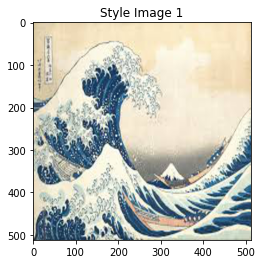

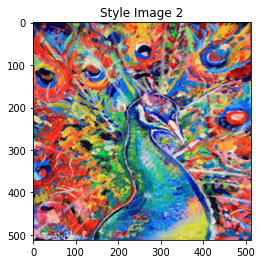

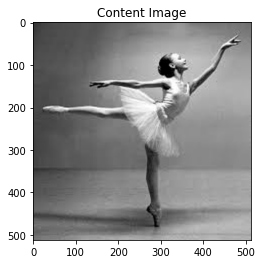

In [7]:
unloader = transforms.ToPILImage()  


def imshow(tensor, title=None):
    image = tensor.cpu().clone()  
    image = image.squeeze(0)     
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) 


plt.figure()
imshow(style_img_1, title='Style Image 1')

plt.figure()
imshow(style_img_2, title='Style Image 2')

plt.figure()
imshow(content_img, title='Content Image')


In [0]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [0]:
def gram_matrix(input):
    a, b, c, d = input.size() 

    features = input.view(a * b, c * d)  

    G = torch.mm(features, features.t()) 

    return G.div(a * b * c * d)


# Будем смешивать два лосса вместе и смотреть, что получится

In [0]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature_1, target_feature_2):
        super(StyleLoss, self).__init__()
        self.target_1 = gram_matrix(target_feature_1).detach()
        self.target_2 = gram_matrix(target_feature_2).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss_1 = F.mse_loss(G, self.target_1)
        self.loss_2 = F.mse_loss(G, self.target_2)
        return input

In [0]:
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

In [12]:
cnn = models.vgg19(pretrained=True).features.to(device)
cnn.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [0]:
cnn_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_std = torch.tensor([0.229, 0.224, 0.225]).to(device)


In [0]:
content_layers_default = ['conv_5']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']


In [0]:
def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img_1, style_img_2, content_img,
                               content_layers,
                               style_layers, mode='vgg'):
    cnn = copy.deepcopy(cnn)

    normalization = Normalization(normalization_mean, normalization_std).to(device)

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    i = 0  
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            if mode == 'vgg':
                i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            if mode == 'resnet':
                i += 1
                name = 'layer{}'.format(i)
            else:
                raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature_1 = model(style_img_1).detach()
            target_feature_2 = model(style_img_2).detach()
            style_loss = StyleLoss(target_feature_1, target_feature_2)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses


In [0]:
input_img = content_img.clone()

In [0]:
def style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img_1, style_img_2,
                        input_img, type, 
                        content_layers=content_layers_default,
                        style_layers=style_layers_default,
                       num_steps=400,
                       style_weight_1=1e10, 
                        style_weight_2=1e10,
                        content_weight=1):
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img_1, style_img_2, content_img, content_layers, style_layers,
        mode=type)
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    print('Optimizing..')
    epoch = [0]
    while epoch[0] <= num_steps:

        def closure():

            input_img.data.clamp_(0, 1)
            

            optimizer.zero_grad()
            curr_img = model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += style_weight_1 * sl.loss_1 +  \
                    style_weight_2 * sl.loss_2 # Вот тут берем взвешенную 
                                               # cумму обоих лоссов
            for cl in content_losses:
                content_score += cl.loss

            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            epoch[0] += 1
            if epoch[0] % 50 == 0:
                plt.figure()
                imshow(input_img, title='Image on epoch ' + str(epoch[0]))
                print("epoch {}:".format(epoch))
                print('Style_1 Loss : {:4f} Content Loss: {:4f}'.format(
                     style_weight_1 * sl.loss_1.item(), content_score))
                print('Style_2 Loss : {:4f} Content Loss: {:4f}'.format(
                     style_weight_2 * sl.loss_2.item(), content_score))
                print()

            return style_score + content_score

        optimizer.step(closure)

    input_img.data.clamp_(0, 1)

    return input_img

# Посмотрим на картинки!

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  """


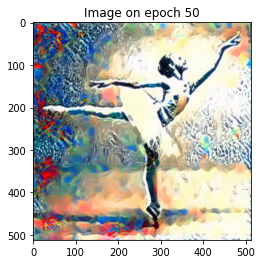

epoch [50]:
Style_1 Loss : 162781879.771501 Content Loss: 62.255157
Style_2 Loss : 813617780.804634 Content Loss: 62.255157



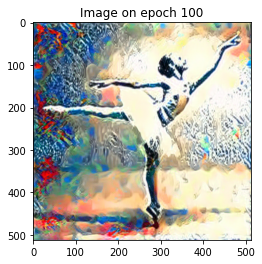

epoch [100]:
Style_1 Loss : 162838120.013475 Content Loss: 62.336464
Style_2 Loss : 813557133.078575 Content Loss: 62.336464



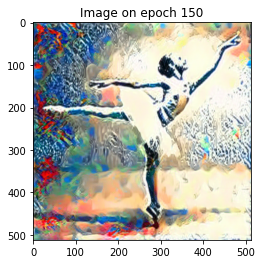

epoch [150]:
Style_1 Loss : 162825197.912753 Content Loss: 62.408638
Style_2 Loss : 813570469.617844 Content Loss: 62.408638



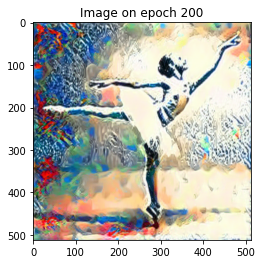

epoch [200]:
Style_1 Loss : 162080430.891365 Content Loss: 62.321186
Style_2 Loss : 814347416.162491 Content Loss: 62.321186



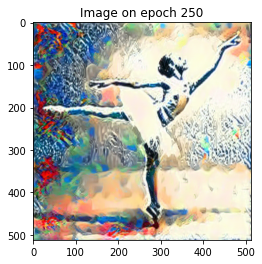

epoch [250]:
Style_1 Loss : 162833824.288100 Content Loss: 62.581837
Style_2 Loss : 813555791.974068 Content Loss: 62.581837



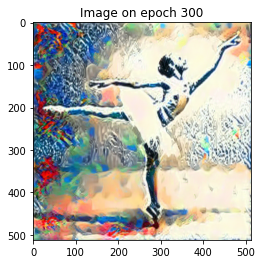

epoch [300]:
Style_1 Loss : 162677757.907659 Content Loss: 62.664570
Style_2 Loss : 813709869.980812 Content Loss: 62.664570



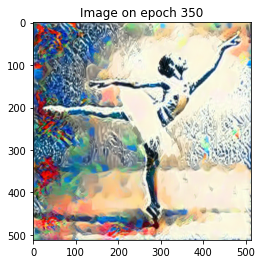

epoch [350]:
Style_1 Loss : 162723695.393652 Content Loss: 62.708206
Style_2 Loss : 813662782.311440 Content Loss: 62.708206



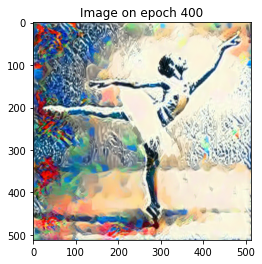

epoch [400]:
Style_1 Loss : 162709085.270762 Content Loss: 62.757256
Style_2 Loss : 813676714.897156 Content Loss: 62.757256



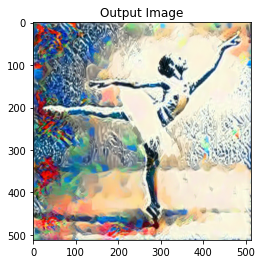

In [22]:
output = style_transfer(cnn, cnn_mean, cnn_std,
                            content_img, style_img_1, style_img_2, 
                        input_img, 'vgg',
                        
                            style_weight_1=5e10,
                            style_weight_2=1e10
                        )


plt.figure()
imshow(output, title='Output Image')

plt.show()

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  """


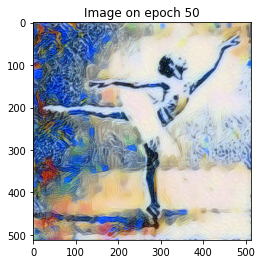

epoch [50]:
Style_1 Loss : 84285475.313663 Content Loss: 195.703140
Style_2 Loss : 10244575.969409 Content Loss: 195.703140



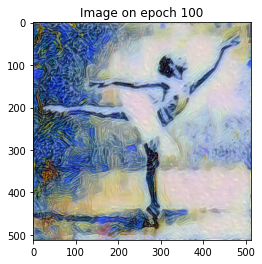

epoch [100]:
Style_1 Loss : 85298558.697104 Content Loss: 194.414459
Style_2 Loss : 8533721.847925 Content Loss: 194.414459



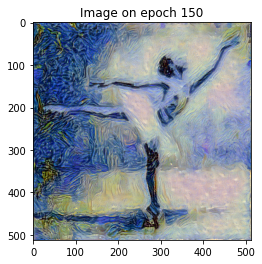

epoch [150]:
Style_1 Loss : 85045062.005520 Content Loss: 192.181793
Style_2 Loss : 8672765.397932 Content Loss: 192.181793



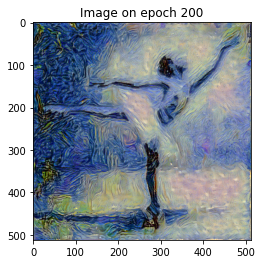

epoch [200]:
Style_1 Loss : 85008256.137371 Content Loss: 190.770142
Style_2 Loss : 8578918.641433 Content Loss: 190.770142



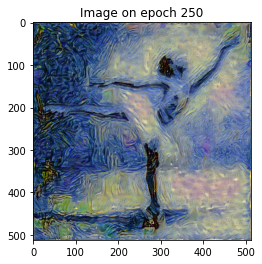

epoch [250]:
Style_1 Loss : 84977727.383375 Content Loss: 189.983444
Style_2 Loss : 8577987.318859 Content Loss: 189.983444



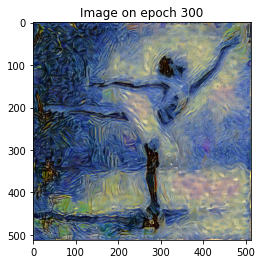

epoch [300]:
Style_1 Loss : 85025057.196617 Content Loss: 189.220001
Style_2 Loss : 8507312.304573 Content Loss: 189.220001



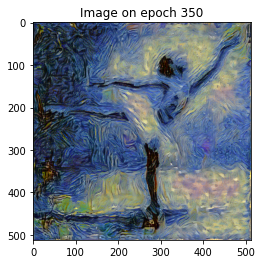

epoch [350]:
Style_1 Loss : 85022989.660501 Content Loss: 188.743790
Style_2 Loss : 8500648.254994 Content Loss: 188.743790



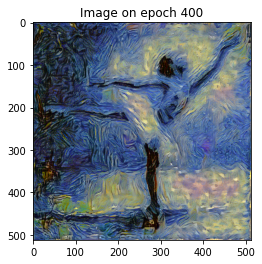

epoch [400]:
Style_1 Loss : 84997992.962599 Content Loss: 188.493408
Style_2 Loss : 8519624.680048 Content Loss: 188.493408



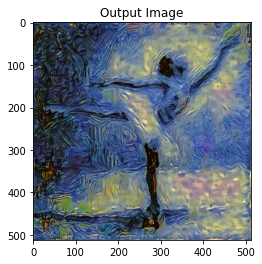

In [24]:
output = style_transfer(cnn, cnn_mean, cnn_std,
                            content_img, style_img_1, style_img_2, 
                        input_img, 'vgg',
                        
                            style_weight_1=1e10,
                            style_weight_2=1e11
                        )


plt.figure()
imshow(output, title='Output Image')

plt.show()

 # И еще посмотрим на картинки

In [0]:
style_img_1 = image_loader("./drive/My Drive/mipt_dl_school/Homework/arabesque.jpg")
style_img_2 = image_loader("./drive/My Drive/mipt_dl_school/Homework/starry_night.jpg")
content_img = image_loader("./drive/My Drive/mipt_dl_school/Homework/eiffel_tower.jpg")

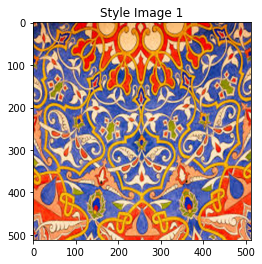

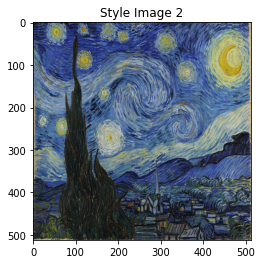

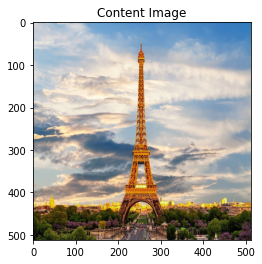

In [37]:
plt.figure()
imshow(style_img_1, title='Style Image 1')

plt.figure()
imshow(style_img_2, title='Style Image 2')

plt.figure()
imshow(content_img, title='Content Image')

In [0]:
input_img = content_img.clone()

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  """


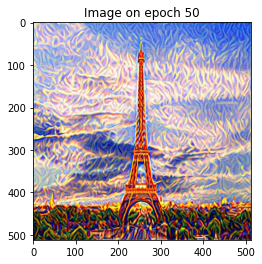

epoch [50]:
Style_1 Loss : 148256181.273609 Content Loss: 124.810196
Style_2 Loss : 674349367.618561 Content Loss: 124.810196



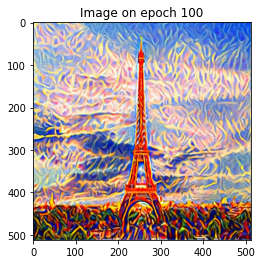

epoch [100]:
Style_1 Loss : 154254026.710987 Content Loss: 131.810654
Style_2 Loss : 662387982.010841 Content Loss: 131.810654



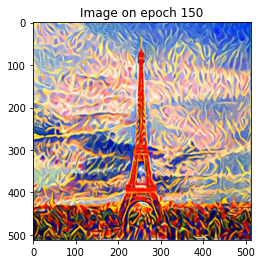

epoch [150]:
Style_1 Loss : 140696344.897151 Content Loss: 138.791550
Style_2 Loss : 673863589.763641 Content Loss: 138.791550



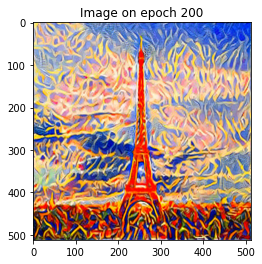

epoch [200]:
Style_1 Loss : 133822392.672300 Content Loss: 143.178207
Style_2 Loss : 680241584.777832 Content Loss: 143.178207



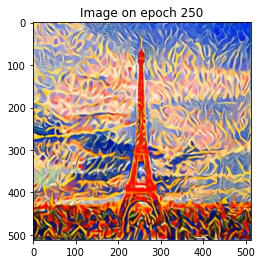

epoch [250]:
Style_1 Loss : 136554159.689695 Content Loss: 144.964386
Style_2 Loss : 677258670.330048 Content Loss: 144.964386



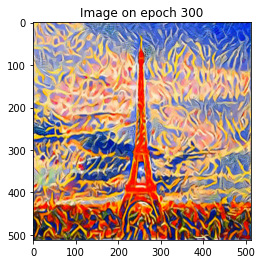

epoch [300]:
Style_1 Loss : 136367068.625987 Content Loss: 146.572845
Style_2 Loss : 677357167.005539 Content Loss: 146.572845



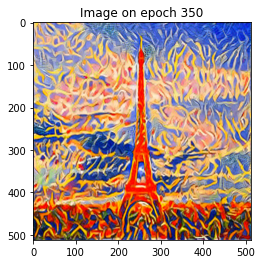

epoch [350]:
Style_1 Loss : 136148207.820952 Content Loss: 147.739777
Style_2 Loss : 677534118.294716 Content Loss: 147.739777



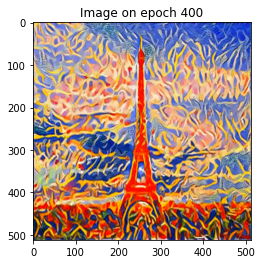

epoch [400]:
Style_1 Loss : 135483604.390174 Content Loss: 148.761734
Style_2 Loss : 678172260.522842 Content Loss: 148.761734



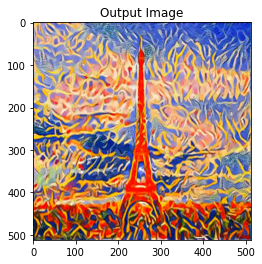

In [39]:
output = style_transfer(cnn, cnn_mean, cnn_std,
                            content_img, style_img_1, style_img_2, 
                        input_img, 'vgg',
                        
                            style_weight_1=5e10,
                            style_weight_2=1e10
                        )


plt.figure()
imshow(output, title='Output Image')

plt.show()

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  """


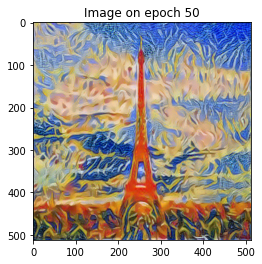

epoch [50]:
Style_1 Loss : 677833631.634712 Content Loss: 87.277954
Style_2 Loss : 136634474.620223 Content Loss: 87.277954



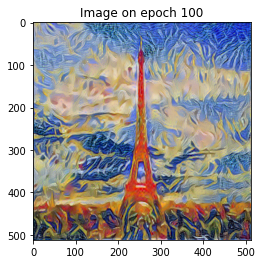

epoch [100]:
Style_1 Loss : 678265169.262886 Content Loss: 85.855499
Style_2 Loss : 135535025.037825 Content Loss: 85.855499



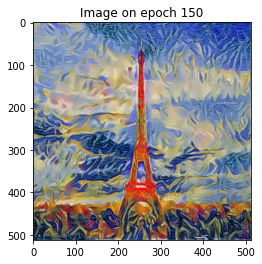

epoch [150]:
Style_1 Loss : 678102150.559425 Content Loss: 84.478394
Style_2 Loss : 135589577.257633 Content Loss: 84.478394



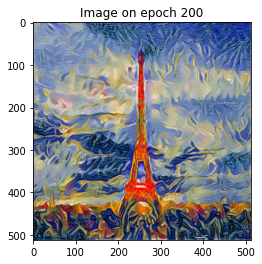

epoch [200]:
Style_1 Loss : 677669495.344162 Content Loss: 83.942566
Style_2 Loss : 135992793.366313 Content Loss: 83.942566



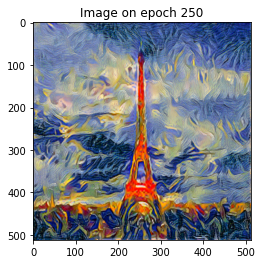

epoch [250]:
Style_1 Loss : 678110644.221306 Content Loss: 84.095078
Style_2 Loss : 135528633.836657 Content Loss: 84.095078



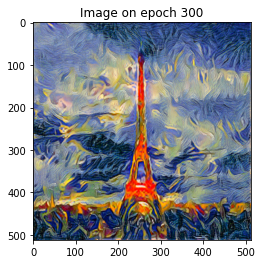

epoch [300]:
Style_1 Loss : 677884370.088577 Content Loss: 84.474625
Style_2 Loss : 135742244.310677 Content Loss: 84.474625



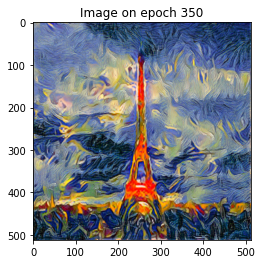

epoch [350]:
Style_1 Loss : 678233876.824379 Content Loss: 84.891235
Style_2 Loss : 135389831.848443 Content Loss: 84.891235



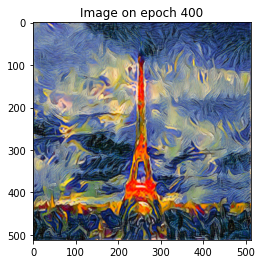

epoch [400]:
Style_1 Loss : 678005889.058113 Content Loss: 85.459175
Style_2 Loss : 135609926.655889 Content Loss: 85.459175



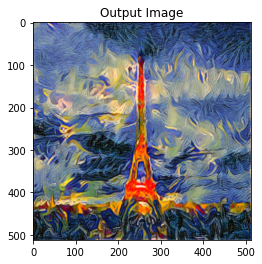

In [40]:
output = style_transfer(cnn, cnn_mean, cnn_std,
                            content_img, style_img_1, style_img_2, 
                        input_img, 'vgg',
                        
                            style_weight_1=1e10,
                            style_weight_2=5e10
                        )


plt.figure()
imshow(output, title='Output Image')

plt.show()

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  """


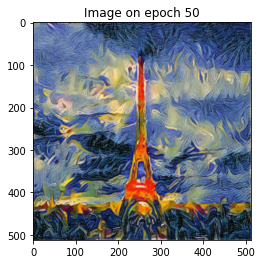

epoch [50]:
Style_1 Loss : 806966200.470924 Content Loss: 79.059731
Style_2 Loss : 80644071.567804 Content Loss: 79.059731



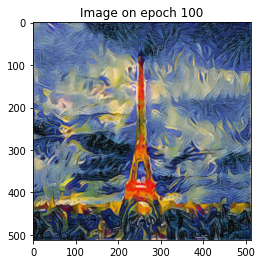

epoch [100]:
Style_1 Loss : 806722491.979599 Content Loss: 79.205132
Style_2 Loss : 80861407.332122 Content Loss: 79.205132



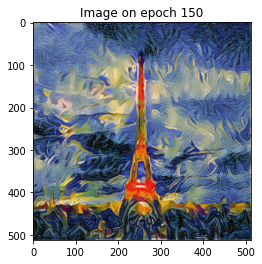

epoch [150]:
Style_1 Loss : 806894823.908806 Content Loss: 79.079269
Style_2 Loss : 80684490.967542 Content Loss: 79.079269



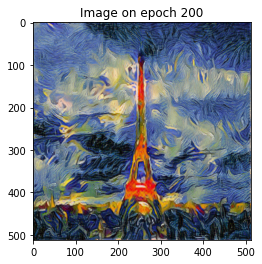

epoch [200]:
Style_1 Loss : 806856676.936150 Content Loss: 79.133759
Style_2 Loss : 80720975.529402 Content Loss: 79.133759



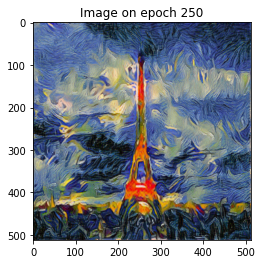

epoch [250]:
Style_1 Loss : 806884691.119194 Content Loss: 79.389450
Style_2 Loss : 80691243.056208 Content Loss: 79.389450



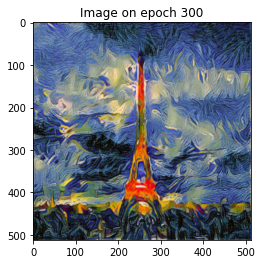

epoch [300]:
Style_1 Loss : 806876718.997955 Content Loss: 79.720276
Style_2 Loss : 80697663.361207 Content Loss: 79.720276



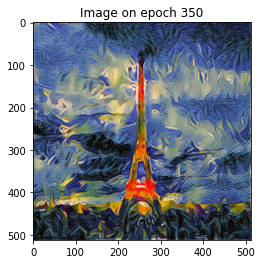

epoch [350]:
Style_1 Loss : 806880593.299866 Content Loss: 80.044144
Style_2 Loss : 80692640.040070 Content Loss: 80.044144



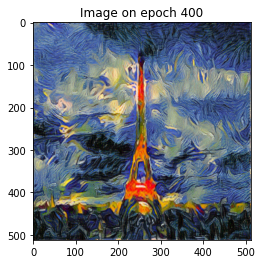

epoch [400]:
Style_1 Loss : 806878805.160522 Content Loss: 80.280945
Style_2 Loss : 80693647.032604 Content Loss: 80.280945



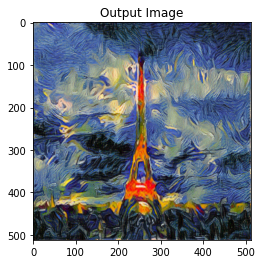

In [41]:
output = style_transfer(cnn, cnn_mean, cnn_std,
                            content_img, style_img_1, style_img_2, 
                        input_img, 'vgg',
                        
                            style_weight_1=1e10,
                            style_weight_2=1e11
                        )


plt.figure()
imshow(output, title='Output Image')

plt.show()

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  """


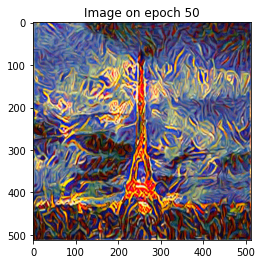

epoch [50]:
Style_1 Loss : 125296282.931231 Content Loss: 180.827423
Style_2 Loss : 960175991.058350 Content Loss: 180.827423



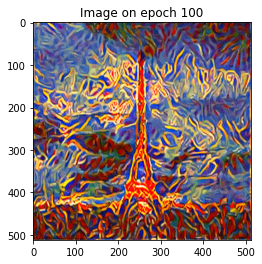

epoch [100]:
Style_1 Loss : 37542369.682342 Content Loss: 182.270172
Style_2 Loss : 964348018.169403 Content Loss: 182.270172



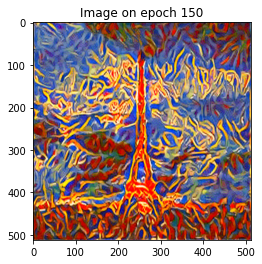

epoch [150]:
Style_1 Loss : 20629569.917219 Content Loss: 184.103058
Style_2 Loss : 963846370.577812 Content Loss: 184.103058



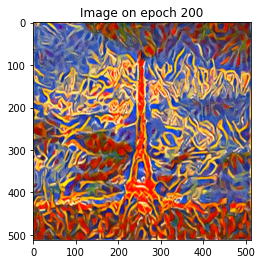

epoch [200]:
Style_1 Loss : 19136004.993925 Content Loss: 184.749451
Style_2 Loss : 957001149.654388 Content Loss: 184.749451



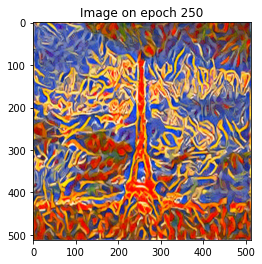

epoch [250]:
Style_1 Loss : 15190192.243608 Content Loss: 185.917130
Style_2 Loss : 957196801.900864 Content Loss: 185.917130



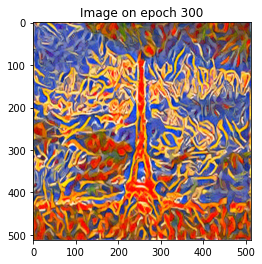

epoch [300]:
Style_1 Loss : 79429344.623350 Content Loss: 186.534286
Style_2 Loss : 956560373.306274 Content Loss: 186.534286



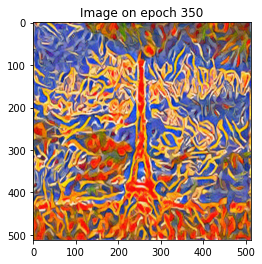

epoch [350]:
Style_1 Loss : 16987572.962535 Content Loss: 187.630936
Style_2 Loss : 958416312.932968 Content Loss: 187.630936



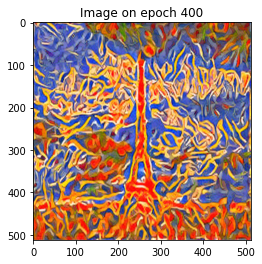

epoch [400]:
Style_1 Loss : 10751609.806903 Content Loss: 187.506470
Style_2 Loss : 957284122.705460 Content Loss: 187.506470



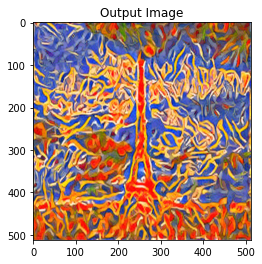

In [43]:

output = style_transfer(cnn, cnn_mean, cnn_std,
                            content_img, style_img_1, style_img_2, 
                        input_img, 'vgg',
                        
                            style_weight_1=1e12,
                            style_weight_2=1e10
                        )


plt.figure()
imshow(output, title='Output Image')

plt.show()